In [1]:
import cells_extractor
from link_reader import LinkReader

mask = cells_extractor.get_omnipose_mask_dict("/Users/sherryyang/Documents/wiggins-lab/data/1023/xy5/masks/*.png")
cells, error = cells_extractor.get_cells_set_by_mask_dict(mask)

In [2]:
reader = LinkReader(cells)

In [48]:
spots_filename = "/Users/sherryyang/Documents/wiggins-lab/data/spots-simple.csv"
edge_filename = "/Users/sherryyang/Documents/wiggins-lab/data/tracks-simple.csv"
G_trackmate = reader.abstract_trackmate_linking_result(spots_filename, edge_filename)

In [4]:
import visualizer
info = visualizer.get_label_info(G, False)

In [ ]:
base_dir = "/Users/sherryyang/Documents/wiggins-lab/data/1024/xy5/phase"
visualizer.get_single_track_visualization(G,base_dir, info)

In [ ]:
visualizer.image_to_tif_sequence("/Users/sherryyang/Documents/wiggins-lab/data/1024/xy5/phase/video")

In [ ]:
info

In [ ]:
from cell_event import CellType
from visualizer import CELL_TYPE_COLOR
visualizer.CELL_TYPE_COLOR

In [ ]:
import visualizer
visualizer.CELL_TYPE_COLOR 

In [ ]:
outgoing

In [ ]:
incoming

In [ ]:
from cell_event import CellDefine, CellEvent
from cell import Cell

In [ ]:
define = CellDefine(G,Cell(0,1))

In [ ]:
print(define)

In [ ]:

tag = visualizer.tag_type(G)

In [ ]:
from visualizer import CELL_EVENT_COLOR

In [ ]:
node_special = {CELL_EVENT_COLOR[CellEvent.BIRTH]: tag[CellEvent.BIRTH], CELL_EVENT_COLOR[CellEvent.DIE]: tag[CellEvent.DIE]}
edge_special = {CELL_EVENT_COLOR[CellEvent.SPLIT]: tag[CellEvent.SPLIT], CELL_EVENT_COLOR[CellEvent.MERGE]: tag[CellEvent.MERGE]}

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.ticker as ticker

pos = visualizer.get_lineage_pos(G)

def plot_lineage(G, pos, with_background, nodes_special = None, edges_special = None, show_stat = True, figsize = (15,12), arrow = False):
    fig, ax = plt.subplots(figsize=figsize)

    node_list = list(G.nodes())
    node_list.sort()

    # draw background
    if with_background: 
        nx.draw(G, pos, node_size = 0,  width=1, edge_color="grey", arrows = arrow, ax=ax)
    if nodes_special != None:
        for color, nodes in nodes_special.items():
            nx.draw_networkx_nodes(G, pos, nodelist=list(nodes), node_size=20, node_color=color, ax=ax)
        for color, edges in edges_special.items():
            nx.draw_networkx_edges(G, pos, edgelist=edges , width=2, edge_color=color, arrows= arrow, ax=ax)

    # Styling stuff below
    ax.set_frame_on(False)
    ax.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False)
    #ax.set_yticks(np.arange(0, -1 * (node_list[-1].frame + 5) , step=-5))

    def format_fn(tick_val, tick_pos):
        return int(-1 * tick_val)

    ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_fn))

    limits=plt.axis('on')
    if show_stat:
        text = get_graph_stats_text(G)
        ax.text(0.95, 0.95,  text, transform=ax.transAxes, horizontalalignment='right', verticalalignment='top')
        
    ax.grid(True, linestyle='--', alpha=0.5)

    return ax


def sub_plot_lineage(ax, G, pos, with_background, nodes_special = None, edges_special = None, show_stat = True, figsize = (15,12), arrow = False):
    node_list = list(G.nodes())
    node_list.sort()

    # draw background
    if with_background: 
        nx.draw(G, pos, node_size = 0,  width=1, edge_color="grey", arrows = arrow, ax=ax)
    if nodes_special != None:
        for color, nodes in nodes_special.items():
            nx.draw_networkx_nodes(G, pos, nodelist=list(nodes), node_size=20, node_color=color, ax=ax)
        for color, edges in edges_special.items():
            nx.draw_networkx_edges(G, pos, edgelist=edges , width=2, edge_color=color, arrows= arrow, ax=ax)

    # Styling stuff below
    ax.set_frame_on(False)
    ax.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False)
    #ax.set_yticks(np.arange(0, -1 * (node_list[-1].frame + 5) , step=-5))

    def format_fn(tick_val, tick_pos):
        return int(-1 * tick_val)

    ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_fn))

    limits=plt.axis('on')
    if show_stat:
        text = get_graph_stats_text(G)
        ax.text(0.95, 0.95,  text, transform=ax.transAxes, horizontalalignment='right', verticalalignment='top')
        
    ax.grid(True, linestyle='--', alpha=0.5)

    return ax


def get_graph_stats_text(G):

    reader = LinkReader(G.nodes())
    max_frame = reader.frame_num - 1

    merge = 0
    split = 0
    birth = 0
    death = 0 
    stary = 0 
    irregular_death = 0
    for cell in cells:
        define = CellDefine(G,cell)
        merge += define.merge
        split += define.split
        birth += define.birth
        death += define.die
        stary += define.stary
        if define.die and cell.frame != max_frame:
            irregular_death += 1

    coverage_rate = (len(reader.cells) - stary) / len(reader.cells)
    frame_index = sorted(reader.cells_frame_dict)
    last_frame_cells = reader.cells_frame_dict[frame_index[-1]]
    cell_num = len(last_frame_cells)
    text = f"Max frame: {max_frame} \n Coverage rate : {coverage_rate:.0%} \n  last frame cell num:{cell_num} \n  Merge: {merge}, split: {split}, birth:{birth}, death: {death} \n stary: {stary},irregular death: {irregular_death}"
    return text
    

In [ ]:
plot_lineage(G, pos, with_background = True , nodes_special = node_special, edges_special = edge_special)

In [ ]:

def get_lineage_info_for_single_frame(G, frame):
    reader = LinkReader(G.nodes())

    cells_center = reader.cells_frame_dict[frame]
    cell_s = {"red": cells_center}

    connected_edges = set()
    connected_nodes = set()

    for cell in cells_center:
        # Get incoming and outgoing edges for each cell
        in_edges = G.in_edges(cell)
        out_edges = G.out_edges(cell)

        # Update the sets of connected edges and nodes
        connected_edges.update(in_edges)
        connected_edges.update(out_edges)

        # Extract nodes from edges
        for edge in in_edges:
            connected_nodes.add(edge[0])  # Source node of the incoming edge
        for edge in out_edges:
            connected_nodes.add(edge[1])  # Target node of the outgoing edge


    edge_split = tag[CellEvent.SPLIT].intersection(connected_edges)
    edge_split = tag[CellEvent.SPLIT].intersection(connected_edges)

    edge_split = tag[CellEvent.SPLIT].intersection(connected_edges)
    edge_split = tag[CellEvent.SPLIT].intersection(connected_edges)

    edge_s = {"grey": connected_edges, "blue": edge_split }

    cell_s = {"grey": connected_nodes, "blue": cells_center}

    pos = visualizer.get_lineage_pos(G, list(connected_nodes))

    return edge_s, cell_s, pos


In [ ]:
edge_s, cell_s, pos1 = get_lineage_info_for_single_frame(G, 122)
plot_lineage(G, pos1, with_background = False , nodes_special = cell_s, edges_special = edge_s, figsize= (15, 4), arrow = True, show_stat= False)

In [ ]:
nodes_with_edges = [node for node in G.nodes() if len(list(G.neighbors(node))) == 0]

In [ ]:
for node in nodes_with_edges:
    print(node)

In [ ]:
len(nodes_with_edges)

In [ ]:
len(cells)

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import math
from matplotlib.colors import ListedColormap
from PIL import Image
import string
import cv2
import os
import matplotlib.patches as patches
import glob
from link_reader import LinkReader
import networkx as nx

In [ ]:
base_dir = "/Users/sherryyang/Documents/wiggins-lab/data/1024/xy5/phase"

def get_single_track_visualization(G,base_dir, info, circle_label = False, representative_point = False):
    video_dir = os.path.join(base_dir, "video")
    os.makedirs(video_dir, exist_ok=True)

    reader = LinkReader(set(G.nodes()))
    # found all initial images.
    filename = "*.tif"
    file_path = os.path.join(base_dir, filename)

    files = glob.glob(file_path)
    files.sort()

    for frame in range(len(files)):
        # Load and convert the image
        file = files[frame]
        image = cv2.imread(file)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        output_path = os.path.join(video_dir, f"frame{frame:05d}.png")
        # Create a new figure and axis
        fig, ax = plt.subplots()

        ax = visualizer.get_single_frame_visualization(ax, image, reader.cells_frame_dict, info, frame, circle_label, representative_point)
        
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(output_path, bbox_inches='tight', pad_inches=0, transparent=True)
        

In [ ]:
from cell_event import CellType

CELL_TYPE_COLOR = {
    CellType.REGULAR: "#878787", 
    CellType.SPLIT:"#1500FF", 
    CellType.SPLITED:"#756BE1", 
    CellType.MERGE:"#30FF00", 
    CellType.MERGED:"#8DE279", 
    CellType.DIE:"#FF0000", 
    CellType.BIRTH: "#FF00ED",
    CellType.UNKOWN: "#878787",
}

def get_lineage_info_for_single_frame(G, frame, tag = None):
    reader = LinkReader(G.nodes())

    cells_center = reader.cells_frame_dict[frame]
    cell_s = {"red": cells_center}

    connected_edges = set()
    connected_nodes = set()

    for cell in cells_center:
        # Get incoming and outgoing edges for each cell
        in_edges = G.in_edges(cell)
        out_edges = G.out_edges(cell)

        # Update the sets of connected edges and nodes
        connected_edges.update(in_edges)
        connected_edges.update(out_edges)

        # Extract nodes from edges
        for edge in in_edges:
            connected_nodes.add(edge[0])  # Source node of the incoming edge
        for edge in out_edges:
            connected_nodes.add(edge[1])  # Target node of the outgoing edge
    
    edge_s = {"grey": connected_edges}
    cell_s = {"grey": connected_nodes, "blue": cells_center}

    if tag is not None:
        edge_split = tag[CellEvent.SPLIT].intersection(connected_edges)
        edge_merge = tag[CellEvent.MERGE].intersection(connected_edges)

        node_birth = tag[CellEvent.BIRTH].intersection(connected_nodes.union(cells_center))
        node_death = tag[CellEvent.DIE].intersection(connected_nodes.union(cells_center))

        edge_s[CELL_EVENT_COLOR[CellEvent.SPLIT]] = edge_split
        edge_s[CELL_EVENT_COLOR[CellEvent.MERGE]] = edge_merge

        cell_s[CELL_EVENT_COLOR[CellEvent.BIRTH]] = node_birth 
        cell_s[CELL_EVENT_COLOR[CellEvent.DIE]] = node_death

    pos = visualizer.get_lineage_pos(G, list(connected_nodes))

    return  cell_s, edge_s, pos


In [ ]:
node_s, edge_s, pos1  = get_lineage_info_for_single_frame(G,133,tag)

In [ ]:
tag[CellEvent.DIE].intersection(node_s)

In [ ]:
tag[CellEvent.DIE]

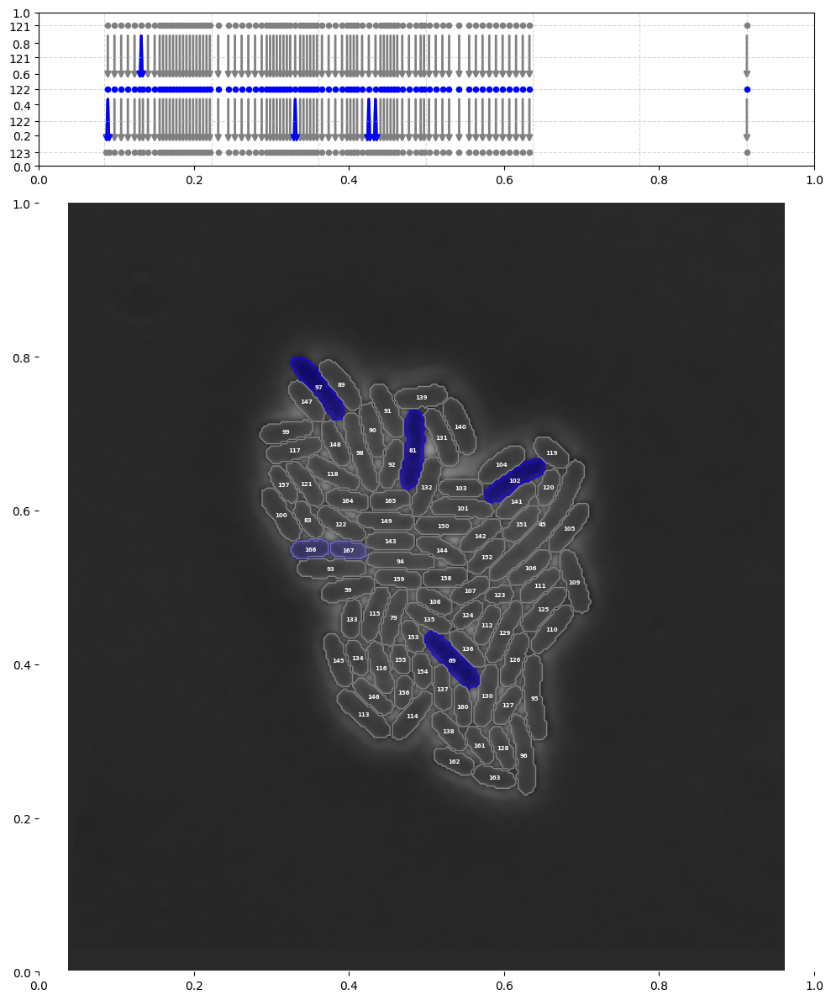

In [20]:
import visualizer
base_dir = "/Users/sherryyang/Documents/wiggins-lab/data/1024/xy5/phase"
info = visualizer.get_label_info(G, False)
get_single_track_visualization(G, base_dir, info)

In [ ]:
tag = visualizer.tag_type(G)

In [19]:
import matplotlib.pyplot as plt
import cv2
import os
import glob
import matplotlib.gridspec as gridspec

def make_multi_visualization(G, base_dir, info, circle_label=False, representative_point=False):
    video_dir = os.path.join(base_dir, "video")
    os.makedirs(video_dir, exist_ok=True)

    reader = LinkReader(set(G.nodes()))

    filename = "*.tif"
    file_path = os.path.join(base_dir, filename)
    files = glob.glob(file_path)
    files.sort()

    tag = visualizer.tag_type(G)
    info = visualizer.get_label_info(G)
    pos = visualizer.get_lineage_pos(G)

    #for frame in range(len(files)):
    for frame in range(122, 123):
        file = files[frame]
        image = cv2.imread(file)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        output_path = os.path.join(video_dir, f"frame{frame:05d}.png")

    
        fig = plt.figure(figsize=(10, 12))  # Set the overall figure size

        # Define GridSpec
        gs = gridspec.GridSpec(2, 1, height_ratios=[1, 5]) 

        ax1 = fig.add_subplot(gs[0])
        ax2 = fig.add_subplot(gs[1])

        plt.box(on=None)
        
        # First subplot for the image
        ax1 = fig.add_subplot(2, 1, 2)  # Adjust layout as needed
        ax1.imshow(image)
        ax1 = visualizer.get_single_frame_visualization(ax1, image, reader.cells_frame_dict, info, frame, circle_label, representative_point)
        ax1.set_axis_off() 
        ax1.set_frame_on(False)
        ax1.axis('off')

        cell_s, edge_s, pos1 = visualizer.get_lineage_info_for_single_frame(G,frame,tag)
        # Second subplot for the lineage graph
        ax2 = fig.add_subplot(2, 1, 1)  # Adjust layout as needed
        ax2 = visualizer.sub_plot_lineage(ax2, G, pos, with_background=False, nodes_special=cell_s, edges_special=edge_s, arrow=True, show_stat=False)
        ax2.set_frame_on(False)

        plt.tight_layout()
        plt.show()

        # plt.savefig(output_path, bbox_inches='tight', pad_inches=0, transparent=True)
        # plt.close(fig)  # Close the figure after saving


In [77]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2
import os
import glob

def make_multi_case_visualization(base_dir, Glist, circle_label=False, representative_point=False):
    
    video_dir = os.path.join(base_dir, "video")
    os.makedirs(video_dir, exist_ok=True)

    
    filename = "*.tif"
    file_path = os.path.join(base_dir, filename)
    files = glob.glob(file_path)
    files.sort()

    n_cases = len(Glist)
    G_index = sorted(Glist)

    tag_dic = {} 
    info_dic = {}
    pos_dic = {}

    for name, G in Glist.items():
        tag_dic[name] = visualizer.tag_type(G)
        info_dic[name] = visualizer.get_label_info(G)
        pos_dic[name] = visualizer.get_lineage_pos(G)

    # Master figure setup
    fig = plt.figure(figsize=(8 * n_cases, 10))  # Adjust the size as needed
    gs = gridspec.GridSpec(2, n_cases, height_ratios=[1, 5])  # 2 rows, n_cases columns
    reader = LinkReader(Glist[G_index[1]])

    #gs = gridspec.GridSpec(2, 1, height_ratios=[1, 5]) 
    for frame in range(len(files)):
        file = files[frame]
        image = cv2.imread(file)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        output_path = os.path.join(video_dir, f"frame{frame:05d}.png")
        for i in range(len(G_index)):
            name = G_index[i]
            print(name)
            G = Glist[name]
            
            tag = tag_dic[name]
            info = info_dic[name]
            pos = pos_dic[name]

            # First subplot for the image
            ax1 = fig.add_subplot(gs[1, i])
            ax1.imshow(image)
            ax1 = visualizer.get_single_frame_visualization(ax1, image, reader.cells_frame_dict, info, frame, circle_label, representative_point)
            ax1.set_axis_off() 
            ax1.set_title(name) 

            cell_s, edge_s, pos1 = visualizer.get_lineage_info_for_single_frame(G, frame, tag)
            # Second subplot for the lineage graph
            ax2 = fig.add_subplot(gs[0, i])
            ax2 = visualizer.sub_plot_lineage(ax2, G, pos, with_background=False, nodes_special=cell_s, edges_special=edge_s, arrow=True, show_stat=False)
            ax2.set_frame_on(False)

        plt.tight_layout()
        #plt.show()
        plt.savefig(output_path, bbox_inches='tight', pad_inches=0, transparent=True)

        # Optionally save the entire figure
        #plt.savefig("master_plot.png", bbox_inches='tight', pad_inches=0, transparent=True)

# Call the function
#make_multi_case_visualization(G, base_dir, n_cases=5, circle_label=True, representative_point=True)


In [73]:
spots_filename = "/Users/sherryyang/Documents/wiggins-lab/data/spots_kalman_lap_1115.csv"
edge_filename = "/Users/sherryyang/Documents/wiggins-lab/data/tracks_kalman_lap_1115.csv"
G_kalman = reader.abstract_trackmate_linking_result(spots_filename, edge_filename)

In [78]:
Glist = {"a.simple advance overlap :)": G , "a.trackmate overlap": G_trackmate, "b.trackmate kalman": G_kalman}

In [62]:
tag = visualizer.tag_type(G_trackmate)

In [64]:
tag = {}
info = {}
pos = {}

for name, G in Glist.items():
    tag[name] = visualizer.tag_type(G)
    info[name] = visualizer.get_label_info(G)
    pos[name] = visualizer.get_lineage_pos(G)


In [67]:
tag["simple_advance_overlap"]

{<CellEvent.DIE: 'die'>: {Cell: frame_140, label_1, <-0x677c6abf90bef71c>,
  Cell: frame_140, label_2, <-0xd2ca1f5a76e8fc3>,
  Cell: frame_140, label_3, <-0x511452dd4409f2f1>,
  Cell: frame_140, label_4, <0x93b75eca5467468>,
  Cell: frame_140, label_5, <-0x77b655b77754eec6>,
  Cell: frame_140, label_6, <-0x1d668ced8e04876d>,
  Cell: frame_140, label_7, <0x3ce93bdc5b4bdfec>,
  Cell: frame_140, label_8, <-0x6fe750b414f8342>,
  Cell: frame_140, label_9, <0x535153bea800e417>,
  Cell: frame_140, label_10, <-0x2da077e5749a7f17>,
  Cell: frame_140, label_11, <0x2caf50e474b5e842>,
  Cell: frame_140, label_12, <-0x1738600327e57aec>,
  Cell: frame_140, label_13, <0x431768c6c16aec6d>,
  Cell: frame_140, label_14, <0x605d16d42abb53c6>,
  Cell: frame_140, label_15, <0x1c7565ec8e1ff098>,
  Cell: frame_140, label_16, <0x76c52eb6777057f1>,
  Cell: frame_140, label_17, <0x32dd7dcedad4f4c3>,
  Cell: frame_140, label_18, <0x50232bdc44255c1c>,
  Cell: frame_140, label_19, <-0x558d0b59d28a3c8b>,
  Cell: fr

a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate kalman
a.simple advance overlap :)
a.trackmate overlap
b.trackmate ka

KeyboardInterrupt: 

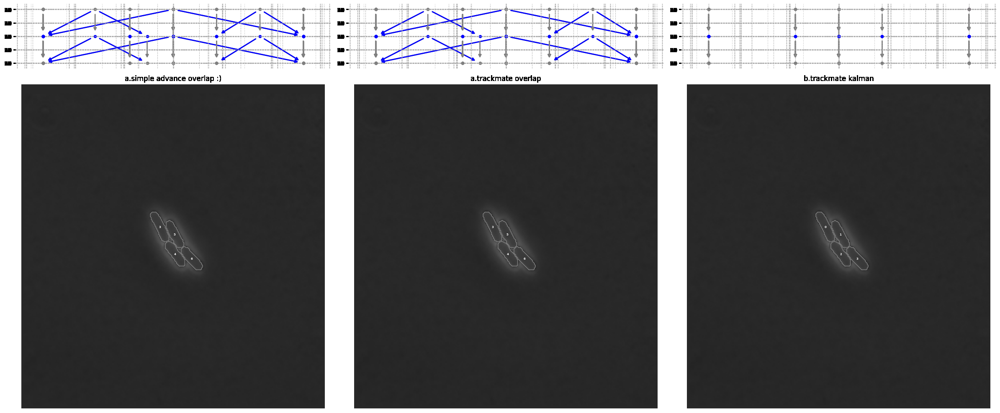

In [79]:
make_multi_case_visualization(base_dir, Glist)

In [41]:
read = LinkReader(cells)
G = read.make_new_dircted_graph()
dict = read.cells_frame_dict
sorted_frame = sorted(dict)

for i in range(1, len(sorted_frame)):
    source_frame = dict[sorted_frame[i-1]]
    target_frame =  dict[sorted_frame[i]]
    for cell in target_frame:
        max_IoU = 0
        best_candidate = None
        for cell_candicate in source_frame:
            intersect = cell.polygon.intersection(cell_candicate.polygon).area 
            union = cell.polygon.union(cell_candicate.polygon).area 
            IoU = intersect * 1.0 / union
            if IoU  > max_IoU:
                max_IoU  = IoU
                best_candidate = cell_candicate
        if best_candidate is not None:
            G.add_edge(best_candidate, cell)

    for cell in source_frame:
        if G.out_degree(cell) == 0:
            max_IoU = 0
            best_candidate = None
            for cell_candicate in target_frame:
                intersect = cell.polygon.intersection(cell_candicate.polygon).area 
                union = cell.polygon.union(cell_candicate.polygon).area 
                IoU = intersect * 1.0 / union
                if IoU  > max_IoU:
                    max_IoU  = IoU
                    best_candidate = cell_candicate
            if best_candidate is not None:
                G.add_edge(cell, best_candidate)


NameError: name 'cells' is not defined

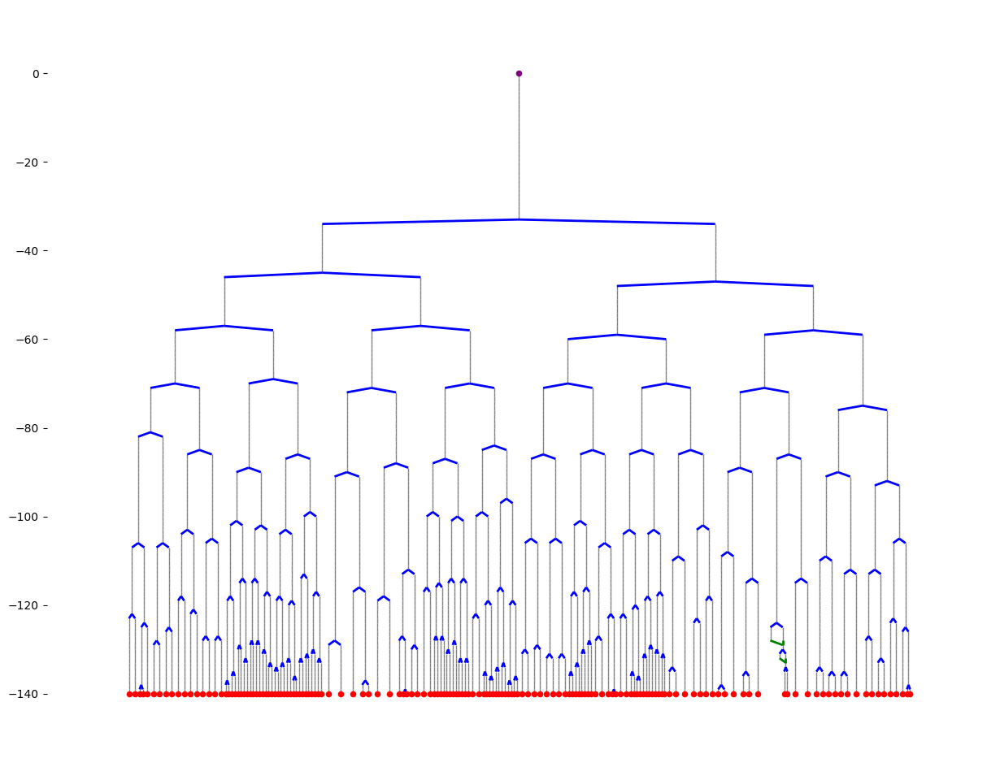

In [45]:
tag = visualizer.tag_type(G)
pos = visualizer.get_lineage_pos(G)

from visualizer import CELL_EVENT_COLOR
from cell_event import CellEvent

node_special = {CELL_EVENT_COLOR[CellEvent.BIRTH]: tag[CellEvent.BIRTH], CELL_EVENT_COLOR[CellEvent.DIE]: tag[CellEvent.DIE]}
edge_special = {CELL_EVENT_COLOR[CellEvent.SPLIT]: tag[CellEvent.SPLIT], CELL_EVENT_COLOR[CellEvent.MERGE]: tag[CellEvent.MERGE]}

visualizer.plot_lineage(G, pos, with_background = True , nodes_special = node_special, edges_special = edge_special)

/Users/sherryyang/Projects/super-segger-toolkit/visualizer.py:316: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


KeyError: 141

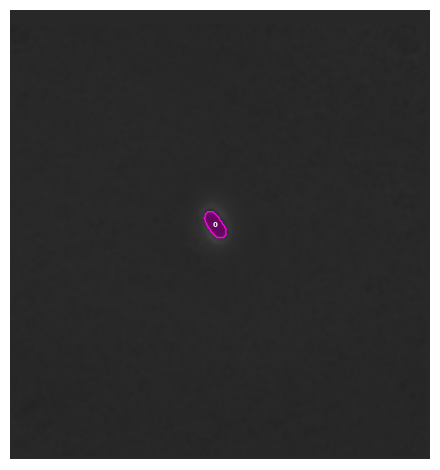

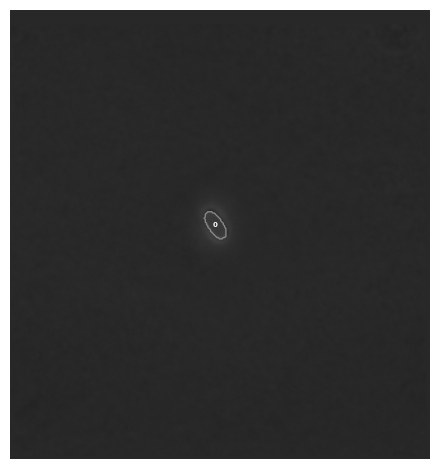

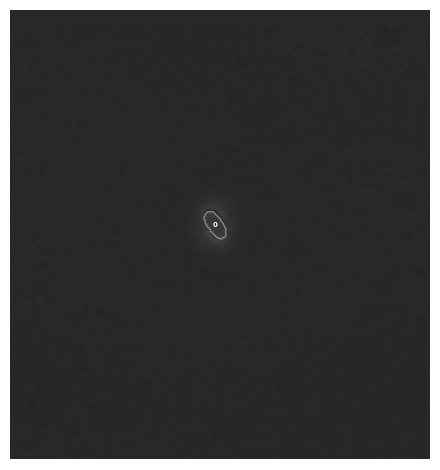

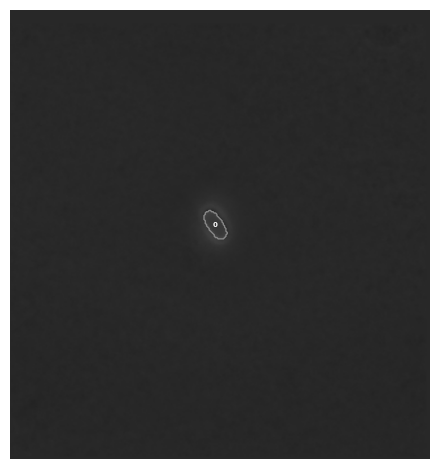

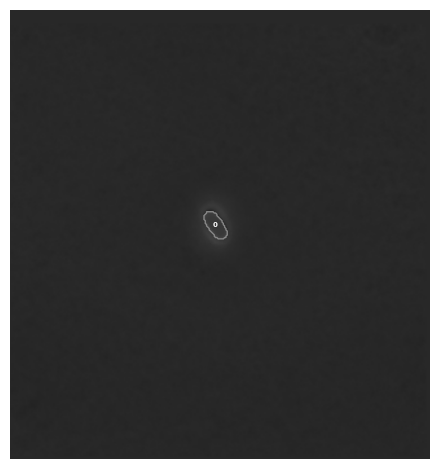

...

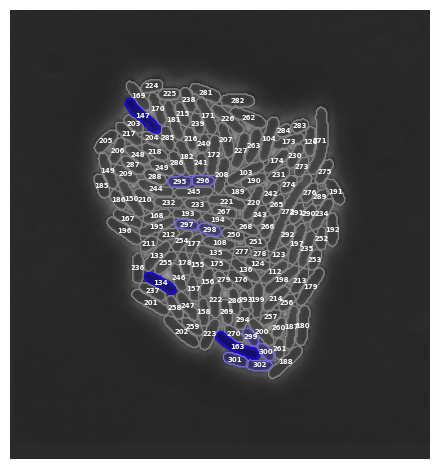

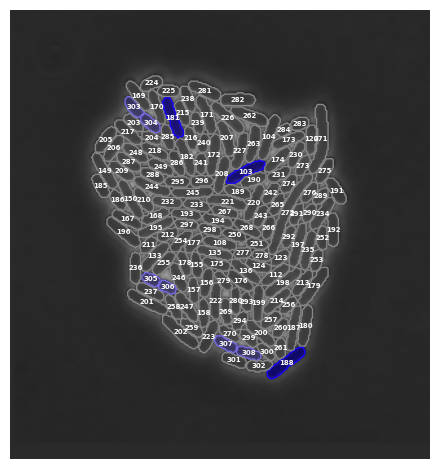

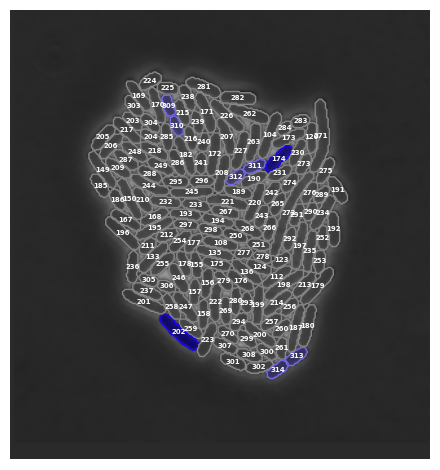

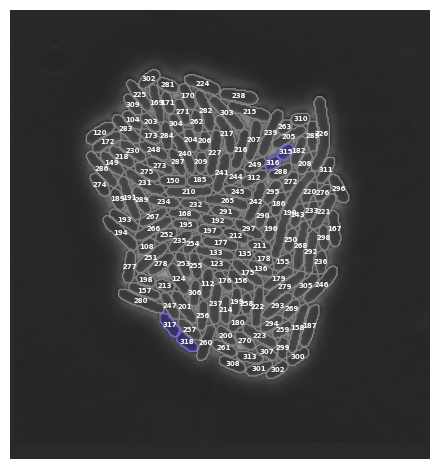

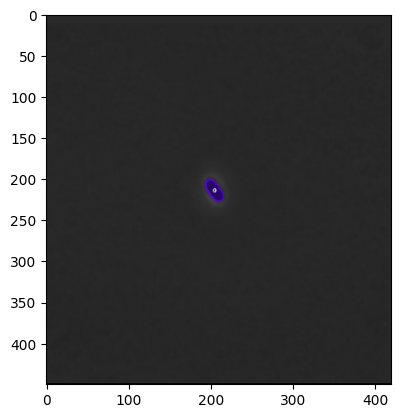

In [47]:
info = visualizer.get_label_info(G)
base_dir = "/Users/sherryyang/Documents/wiggins-lab/data/1024/xy5/phase"
visualizer.get_single_track_visualization(G, base_dir, info)